# Test NPC detection (mature = NPC vs intermediate = PI)

Here we want to:
- use predefined functions to preprocess images (smooth, remove out-of-focus areas)
- define detection thresholds for POM121 and mAb414 channels
- find POM121 and mAB414 (for POM121, it is important to detect the center of the ring => refine minpeakdist)
- sort out PIs and NPCs
- visualize results

I will use this Jupyter notebook to optimize paramaters. Then I will define functions to treat all images.

## Table of content:
* [Import libraries](#libraries)
* [Pre-process images](#pre-processing)
* [Detect peaks](#detect)
* [Sort pore types](#sorting)
* [Analyze pore intermediate](#results)



---

## Import libraries <a class="anchor" id="libraries"></a>



In [1]:
# Import packages
import os
import glob
#import json
from tkinter.filedialog import askdirectory
import tifffile
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import skimage
from skimage import morphology
from skimage.feature import peak_local_max
import skimage.filters as skfilt
from scipy import ndimage as ndi
from scipy import ndimage
import skimage.filters
from skimage.filters import threshold_otsu
import plotly.express as px
#from findmaxima2d import find_maxima, find_local_maxima 


from clustersize import cluster_size
from findmaxima import find_maxima
from binarycellmap import binary_cell_map
from iterative_functions import lorentzian, gaussian, iterative_fit
from nucmask import nucleus_mask, nucleus_focus_mask
from process import process


/opt/anaconda3/envs/NPC/lib/python3.8/site-packages/scipy/__init__.py:138: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.2)
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion} is required for this version of "


---

## Pre-process images <a class="anchor" id="pre-processing"></a>


In [2]:
import os

## Load data and parameters 
#Choose the data folder
dirpath = askdirectory(title='Choose your data folder...',initialdir='/Users/emiliecostes/Documents/2022-2023/Lab3/Results/Raw_data/')  # directory path
print(dirpath)
outputfolder = askdirectory(title='Choose the folder to save your results...',initialdir='/Users/emiliecostes/Documents/2022-2023/Lab3/Results/Results/')

## Set the date
from datetime import datetime

# datetime object containing current date and time
now = datetime.now()
 
print("now =", now)

# dd/mm/YY H:M:S
date = now.strftime("%Y%m%d_%H:%M")
print("date and time =", date)	
outputpath = outputfolder+'/'+date
print(outputpath)
os.mkdir(outputpath)

## Define parameter constants

#difgaus_sigmahi_nm = 100  # difference of gaussians high_sigma in nm
sm_size_nm = 30  # Gaussian size in nm for pore detection
gf_nm = 10 # Gaussian size in nm for denoising
gaussstd_nm = 500 # size of the low-pass filter for removal of out-of-focus areas and deblurring


minpeakdist = 40  # minimum distance between peaks in nm for peak detection 


## Choose to analyze the whole set of data or just one
allimgs = False  # parameter to check if you want to loop through all imgs or just analyse one


## Load images paths
if allimgs:
    files = glob.glob(os.path.join(dirpath, '*[0-9].tif'))
    
else:
    files = [os.path.join(dirpath, '230126/')]
# this path has to be change depending on the file --> to be modified


######################################################################################################################

pores = [] 

## Extract image names from paths
for filepath in files:
    imgname = filepath.split('/')[-1].split('.')[0]
    print(imgname)
    condition = imgname.split('_')[-1].split('-')[0]
    
    # Load raw image file and read pixel size from metadata
    mABpath = os.path.join(dirpath, imgname+'1.msr_414.tif')   
    POMpath = os.path.join(dirpath, imgname+'1.msr_POM.tif')
    Nup96path = os.path.join(dirpath, imgname + '1.msr_nanoGFP.tif')
    
    
    with tifffile.TiffFile(mABpath) as tif:
        mABraw = tif.pages[0].asarray()  # image as numpy array
        pxs_nm = 1e9/tif.pages[0].tags['XResolution'].value[0]  # pixel size in nm
        print('px size= ',pxs_nm)
        
    with tifffile.TiffFile(POMpath) as tif:
        POMraw = tif.pages[0].asarray()  # image as numpy array
        #print(POMraw.shape)
        
    with tifffile.TiffFile(Nup96path) as tif:
        Nup96raw = tif.pages[0].asarray()  # image as numpy array
        #print(Nup96raw.shape)
        
######################################################################################################################
## Pre-process images 
    
    mAB = process(mABraw, gf_nm, pxs_nm)
    
    fig,(ax0,ax1) = plt.subplots(nrows=1,ncols=2,figsize=(16,16))
    ax0.imshow(mABraw)
    ax1.imshow(mAB)
    
    POM = process(POMraw, gf_nm, pxs_nm)
    
    fig,(ax2,ax3) = plt.subplots(nrows=1,ncols=2,figsize=(16,16))
    ax2.imshow(POMraw)
    ax3.imshow(POM)
    
    Nup96 = process(Nup96raw, gf_nm, pxs_nm)
    
    fig,(ax4,ax5) = plt.subplots(nrows=1,ncols=2,figsize=(16,16))
    ax4.imshow(Nup96raw)
    ax5.imshow(Nup96)

    
## Get binary mask
    mask = nucleus_focus_mask(mAB, gaussstd_nm=500, pxs_nm=15, num_di=12, num_er=5)
    
    B = np.zeros(mAB.shape)
    RGB0 = np.dstack((mAB,POM,Nup96))
    POMimg = POM*mask
    mABimg = mAB*mask
    Nup96img = Nup96*mask
    RGB1 = np.dstack((mABimg,POMimg,Nup96img))
    RGB2 = np.dstack((mABimg,POMimg,B))

    fig,ax6 = plt.subplots(figsize=(16,16))
    ax6.imshow(RGB0)
    
    fig,ax7 = plt.subplots(figsize=(16,16))
    ax7.imshow(RGB1)
    
    fig,ax8 = plt.subplots(figsize=(16,16))
    ax8.imshow(RGB2)


now = 2023-03-10 11:28:22.774358
date and time = 20230310_11:28
/20230310_11:28


OSError: [Errno 30] Read-only file system: '/20230310_11:28'

---

## Detect peaks <a class="anchor" id="detect"></a>


/Users/emiliecostes/Documents/2022-2023/Lab3/Data_analysis/STED_PI_sizes copy/findmaxima.py:16: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  is_peak = peak_local_max(img, min_distance=min_dist, threshold_abs=thresh_abs, num_peaks_per_label=1, indices=False)


(2655, 2)
(2700, 2)


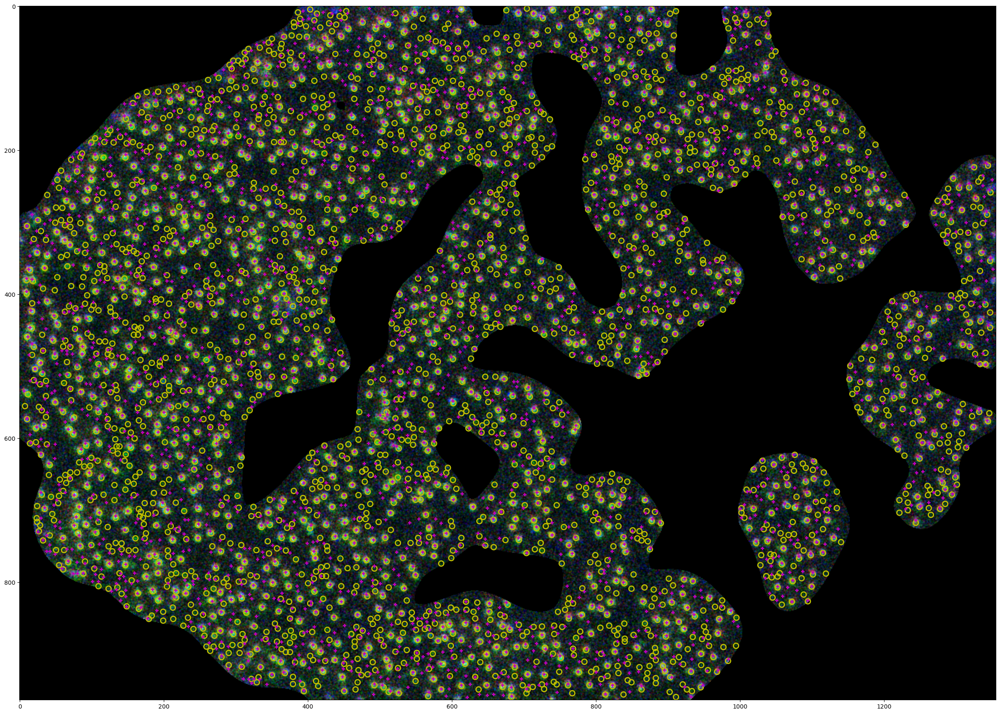

In [64]:
######################################################################################################################
## Detect pore intermediates
sm_size_nm = 30

## Determine thresholds with otsu method
ThPOM = threshold_otsu(POMimg)-0.5*np.std(POMimg)  
ThmAB = threshold_otsu(mABimg)-0.5*np.std(mABimg)

## Build RGB image for visual verification

## Detect POM and mAB peaks
POMfilt = ndimage.gaussian_filter(POMimg,sm_size_nm/pxs_nm)
mABfilt = ndimage.gaussian_filter(mABimg,sm_size_nm/pxs_nm)

RGB2 = np.dstack((mABfilt,POMfilt,B))
fig, ax = plt.subplots(figsize=(30,30))
plt.imshow(RGB1)

POM_peaks = find_maxima(POMfilt, thresh_abs=ThPOM, min_dist=round(minpeakdist/pxs_nm))
mAB_peaks = find_maxima(mABfilt, thresh_abs=ThmAB, min_dist=round(minpeakdist/pxs_nm))
ax.scatter(POM_peaks[:, 1], POM_peaks[:, 0], s=80,c='#FF000000',marker='o',edgecolors='y',linewidths=2)
ax.scatter(mAB_peaks[:, 1], mAB_peaks[:, 0], s=30,c='m', marker='+',linewidths=2)

plt.savefig(outputpath+'/'+imgname+'_POM_mAB_peaks.tif',dpi=600)

print(mAB_peaks.shape)
print(POM_peaks.shape)

[[441.73561813   3.2486977 ]
 [453.12730021   3.93224092]
 [549.27677395   3.19511856]
 ...
 [739.27984663 960.53492116]
 [813.95618444 957.64201068]
 [931.18666561 960.02638234]]
(1244, 2)
(1532, 2)


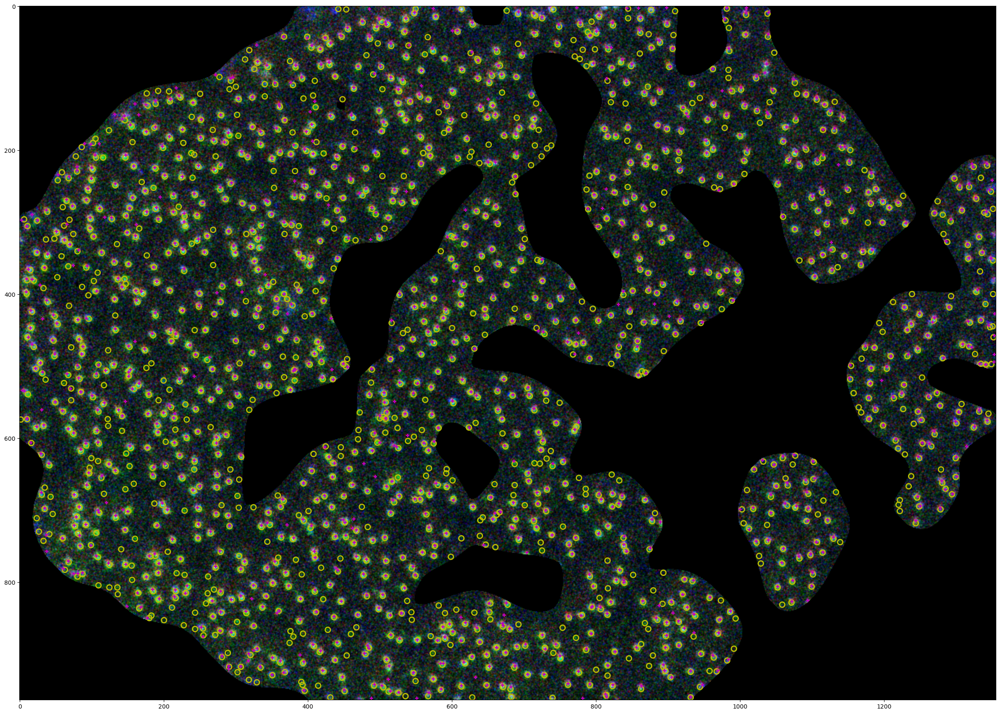

In [65]:
from detect import detect_pores

POMpeaks = detect_pores(POMfilt, threshold=ThPOM, fwhm=120/pxs_nm)
mABpeaks = detect_pores(mABfilt, ThmAB, fwhm=90/pxs_nm)
print(POMpeaks)

#POMpeaks = np.array(POMpeaks)
#mABpeaks = np.array(mABpeaks)

fig, ax = plt.subplots(figsize=(30,30))
plt.imshow(RGB1)
ax.scatter(POMpeaks[:,0], POMpeaks[:,1], s=80,c='#FF000000',marker='o',edgecolors='y',linewidths=2)
ax.scatter(mABpeaks[:,0], mABpeaks[:,1], s=30,c='m', marker='+',linewidths=2)

print(mABpeaks.shape)
print(POMpeaks.shape)

---

## Sort pores <a class="anchor" id="sorting"></a>


In [66]:
# Extract the date of the experiment 
import os
path = dirpath
start = '/Users/emiliecostes/Documents/2022-2023/Lab3/Results/Raw_data/'
date=os.path.relpath(path, start)
print(date)

# create an Empty DataFrame object
df = pd.DataFrame()
 
# append columns to an empty DataFrame
df['Pore_Status'] = ['NPC' for i in range(len(mABpeaks))]
df['x_coordinate'] = mABpeaks[:,0:1]
df['y_coordinate'] = mABpeaks[:,1:2]
df['Date'] = ([date for i in range (len(mABpeaks))])
df['mAB414_POM121_distance']=(['NaN' for i in range (len(mABpeaks))])
 
print(df)

230126
     Pore_Status  x_coordinate  y_coordinate    Date mAB414_POM121_distance
0            NPC    573.985581      2.782248  230126                    NaN
1            NPC    773.459794      1.725238  230126                    NaN
2            NPC    842.498041      1.959247  230126                    NaN
3            NPC    858.898728      2.413429  230126                    NaN
4            NPC    897.869248      1.628311  230126                    NaN
...          ...           ...           ...     ...                    ...
1239         NPC    931.365480    959.441665  230126                    NaN
1240         NPC    488.217926    961.036956  230126                    NaN
1241         NPC    551.160064    961.232029  230126                    NaN
1242         NPC    781.610415    960.969494  230126                    NaN
1243         NPC    814.697625    959.020910  230126                    NaN

[1244 rows x 5 columns]


In [67]:
from scipy.spatial.distance import cdist

def shorter_dist(pt,others):
    distances = cdist(pt,others,'minkowski')
    min_distance = np.min(distances)
    return min_distance

def closest_point(pt,others):
    distances = cdist(pt,others,'minkowski')
    min_coord = others[distances.argmin()]
    return min_coord

In [68]:
import array 

dist = 50/pxs_nm
PI = 0
PI_coord = np.array([])

mAB_POM_dist = []
#fig, ax = plt.subplots(figsize=(30,30))
#plt.imshow(RGB2)
#ax.scatter(mABpeaks[:,0], mABpeaks[:,1], s=30,c='m', marker='+',linewidths=2)
pore_status = []

for i in range (0,len(POMpeaks)):
    if shorter_dist(POMpeaks[[i]],mABpeaks)>=dist:
        mAB_POM_dist.append(shorter_dist(POMpeaks[[i]],mABpeaks))
        PI=PI+1
        PI_coord = np.append(PI_coord,np.array(POMpeaks[[i]])) # On récupère les coordonnées POM121 de chaque pore immature 
        PI_coord = np.reshape(PI_coord,(-1,2))
        pore_status.append('PI')
        #ax.scatter(POMpeaks[i,0], POMpeaks[i,1], s=80,c='#FF000000',marker='o',edgecolors='y',linewidths=2)
        
#print(PI_coord)
#print(mAB_POM_dist)
#print(PI)
#print(type(pore_status))
df2 = pd.DataFrame(pore_status,columns=['Pore_Status'])
df2['x_coordinate']=PI_coord[:,0:1]
df2['y_coordinate']=PI_coord[:,1:2]
df2['Date'] = ([date for i in range (len(PI_coord))])
df2['mAB414_POM121_distance']=([mAB_POM_dist[i] for i in range (len(PI_coord))])
print(df2)

    Pore_Status  x_coordinate  y_coordinate    Date  mAB414_POM121_distance
0            PI    441.735618      3.248698  230126               28.942522
1            PI    453.127300      3.932241  230126               25.087803
2            PI    549.276774      3.195119  230126                5.188494
3            PI    613.174935      3.531796  230126               23.600724
4            PI    740.717908      3.854594  230126               19.165953
..          ...           ...           ...     ...                     ...
478          PI    535.561275    958.291036  230126               11.004824
479          PI    566.502058    958.218249  230126                4.934691
480          PI    628.000119    959.871906  230126               22.424477
481          PI    682.310375    959.260011  230126               13.782463
482          PI    739.279847    960.534921  230126               29.619631

[483 rows x 5 columns]


In [69]:
df_final=pd.concat([df,df2],ignore_index=True)
print(df_final)
df_final.to_csv(outputpath+'/pores.csv')

     Pore_Status  x_coordinate  y_coordinate    Date mAB414_POM121_distance
0            NPC    573.985581      2.782248  230126                    NaN
1            NPC    773.459794      1.725238  230126                    NaN
2            NPC    842.498041      1.959247  230126                    NaN
3            NPC    858.898728      2.413429  230126                    NaN
4            NPC    897.869248      1.628311  230126                    NaN
...          ...           ...           ...     ...                    ...
1722          PI    535.561275    958.291036  230126              11.004824
1723          PI    566.502058    958.218249  230126               4.934691
1724          PI    628.000119    959.871906  230126              22.424477
1725          PI    682.310375    959.260011  230126              13.782463
1726          PI    739.279847    960.534921  230126              29.619631

[1727 rows x 5 columns]


In [98]:
# To be done: append an existing .csv file each time we run the code 

---

## Analyze pore intermediate <a class="anchor" id="results"></a>


In [70]:
from skimage.measure import profile_line
from skimage import io

## Setup parameters for line profiles
L = 150 # length of the line in nm
gf_nm = 10 # sigma in nm for the Gaussian filter

## Load data
pores = pd.read_csv(outputpath+'/pores.csv', sep=',')
pores

,Unnamed: 0,Pore_Status,x_coordinate,y_coordinate,Date,mAB414_POM121_distance
0,0,NPC,573.985581,2.782248,230126,NaN
1,1,NPC,773.459794,1.725238,230126,NaN
2,2,NPC,842.498041,1.959247,230126,NaN
3,3,NPC,858.898728,2.413429,230126,NaN
4,4,NPC,897.869248,1.628311,230126,NaN
...,...,...,...,...,...,...
1722,1722,PI,535.561275,958.291036,230126,11.004824
1723,1723,PI,566.502058,958.218249,230126,4.934691
1724,1724,PI,628.000119,959.871906,230126,22.424477
1725,1725,PI,682.310375,959.260011,230126,13.782463


In [71]:
#### Scan pore coordinates and images
prev_col = pores.columns
data=[]

images = np.unique(pores['Date'])

In [109]:
l = (L/pxs_nm)/2 # length of the line in px

for j in range(0,len(images)):
    imgname = images[j]
    
    #### Trace rotationally averaged intensity profiles
    
    pores_j=pores[pores['Date']==imgname]
    
    for i in range(0,len(pores_j)): 
        prev_data=pores_j.iloc[i,:].values      

        ## length of the line in px
        pxs_nm = pores_j.iloc[i,3]
        l = (L/pxs_nm)/2     

        ## coordinates of pore centers
        xo = pores_j.iloc[i,2]
        yo = pores_j.iloc[i,3]
        ## Rotate the line and define its extremities
        POMprof_a=[]
        mABprof_a=[]
        
        for a in range(0,171,9): 

            src = xo-l*np.cos(a), yo-l*np.sin(a)
            dst = xo+l*np.cos(a), yo+l*np.sin(a)
            
            y_p = profile_line(POM,src,dst,order=2,mode='constant',cval=0)
            y_m = profile_line(mAB,src,dst,order=2,mode='constant',cval=0)
            

            POMprof_a.append(y_p)
            mABprof_a.append(y_m)


        POMprof_i = np.mean(POMprof_a, axis=0)
        mABprof_i = np.mean(mABprof_a, axis=0)

        centers=np.linspace(-L/2,L/2,len(POMprof_i))
        x=np.linspace(-L/2,L/2,120)
################################################################ Jusqu'à ici tout semble fonctionner - le ne comprends pas pourquoi a va de 0 à 171



    #### POM121 channel

        channel = 'POM121'

    #### Fit pore profile with 1 or 2 Lorentzian
        f = lorentzian
        try:
            n, popt, pcov, r_sq, residuals = iterative_fit(f,centers,POMprof_i,nb_iterations=2) 
            '''Iterative fit contains a function called curve_fit that use non-linear least squares to fit a function,
            f, to data'''
        
        except RuntimeError:
            pass
        new_data=[channel,centers,POMprof_i,f,n,r_sq,popt]
        data.append([*prev_data,*new_data])
    
#### Fit pore profile with 1 or 2 Gaussians
        f = gaussian
        try:
            n, popt, pcov, r_sq, residuals = iterative_fit(f,centers,POMprof_i,nb_iterations=2)
        except RuntimeError:
            pass
        
        new_data=[channel,centers,POMprof_i,f,n,r_sq,popt]
        data.append([*prev_data,*new_data])

    #### mAb414 channel

        channel = 'mAb414'

    #### Fit pore profile with 1 or 2 Lorentzian
        f = lorentzian
        try: 
            n, popt, pcov, r_sq, residuals = iterative_fit(f,centers,mABprof_i,nb_iterations=2)
        #ax0.plot(x,f(x, *popt),c='c', linestyle='--')
        #print(f, n,r_sq)
        except RuntimeError:
            pass
        new_data=[channel,centers,mABprof_i,f,n,r_sq,popt]
        data.append([*prev_data,*new_data])

    #### Fit pore profile with 1 or 2 Gaussians
        f = gaussian
        try:
            n, popt, pcov, r_sq, residuals = iterative_fit(f,centers,mABprof_i,nb_iterations=2)
        
        except RuntimeError:
            pass
        new_data=[channel,centers,mABprof_i,f,n,r_sq,popt]
        data.append([*prev_data,*new_data])
    
new_col = ['Channel','Centers (nm)','Intensity','Function','nb iterations','R2','*popt']   
col=[*prev_col,*new_col]
df=pd.DataFrame(data,columns=col)
df

ValueError: `x0` is infeasible.

In [106]:
print(centers)

[-37.5   0.   37.5]


In [105]:
print(mABprof_a)

[array([ 1.39927005e-05, -9.40542281e-05,  4.52737956e-04]), array([-4.44342968e-05, -9.40542281e-05, -3.42223843e-04]), array([-6.26279927e-04, -9.40542281e-05, -5.16745059e-04]), array([-1.01282816e-04, -9.40542281e-05,  2.88679657e-04]), array([ 4.80365443e-04, -9.40542281e-05,  1.34963914e-04]), array([ 2.21340877e-04, -9.40542281e-05, -9.37670318e-04]), array([-1.19111335e-03, -9.40542281e-05,  1.94269850e-04]), array([ 8.88501776e-05, -9.40542281e-05,  1.77560803e-04]), array([ 2.95725566e-04, -9.40542281e-05, -1.60258039e-04]), array([-6.60861206e-04, -9.40542281e-05, -4.58499668e-04]), array([-2.64016036e-04, -9.40542281e-05, -1.48963935e-04]), array([ 6.46632461e-04, -9.40542281e-05,  6.10910465e-05]), array([ 2.06629128e-04, -9.40542281e-05, -3.08250638e-04]), array([-1.40276183e-03, -9.40542281e-05,  2.03611192e-04]), array([ 1.44719459e-04, -9.40542281e-05, -3.35570456e-04]), array([ 4.72872152e-04, -9.40542281e-05, -3.58181254e-05]), array([-4.69824929e-04, -9.40542281e-05